# Clustering Techniques

We will make use of various clustering algorithms to further investigate the "values plus perserverance"/"vpp" dataset.

## Install / import necessary libraries:


In [1]:
!pip3 install seaborn
!pip3 install hdbscan
!pip3 install plotly
import hdbscan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn.cluster as cluster
from sklearn.metrics import silhouette_score
from sklearn import metrics
import time
import seaborn as sns
import scipy
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()

%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}
computation_times = []

clustering_labels = []

df1 = pd.read_csv("data/parameters_igt_vpp.csv",sep=",")
df1

,group,SubID,LR,Out_Sens,Res_Cons,Loss_Aver,Gain_Impa,Loss_Impa,Deca_Rate,RL_weight
0,young,1,0.038441,0.630402,1.207295,1.050323,-0.535035,-1.913099,0.669323,0.660446
1,young,2,0.045673,0.630331,1.628191,0.205205,-0.133367,-1.423580,0.427207,0.719352
2,young,3,0.045468,0.602974,1.395572,0.383055,-0.344822,-1.719826,0.493249,0.688723
3,young,4,0.035789,0.635677,1.067831,0.823790,-0.229192,-1.484455,0.625835,0.675971
4,young,5,0.060655,0.636276,1.802964,0.329246,-0.616020,-2.561017,0.439912,0.655563
...,...,...,...,...,...,...,...,...,...,...
148,old,149,0.110305,0.461300,1.428836,0.960605,2.304410,1.401450,0.149355,0.485665
149,old,150,0.056680,0.450534,1.587805,0.431995,-1.961290,-2.220246,0.600929,0.459507
150,old,151,0.095940,0.433333,1.428801,0.462810,1.099336,1.074293,0.076867,0.604939
151,old,152,0.083711,0.447644,1.405554,0.855610,2.559126,0.338176,0.251166,0.499737


## Select the features we want to cluster on
We are deliberately leaving out age group as we wish to discover other sources of variation among our participants

In [2]:
# get our feature columns

cols = df1.columns[2:]
cols

Index(['LR', 'Out_Sens', 'Res_Cons', 'Loss_Aver', 'Gain_Impa', 'Loss_Impa',
       'Deca_Rate', 'RL_weight'],
      dtype='object')

## Variable PairGrid
This class can be used to compare variables against all other variables. This is helpful in discovering any obvious clusters or features that may be particularly helpful in investigating our data

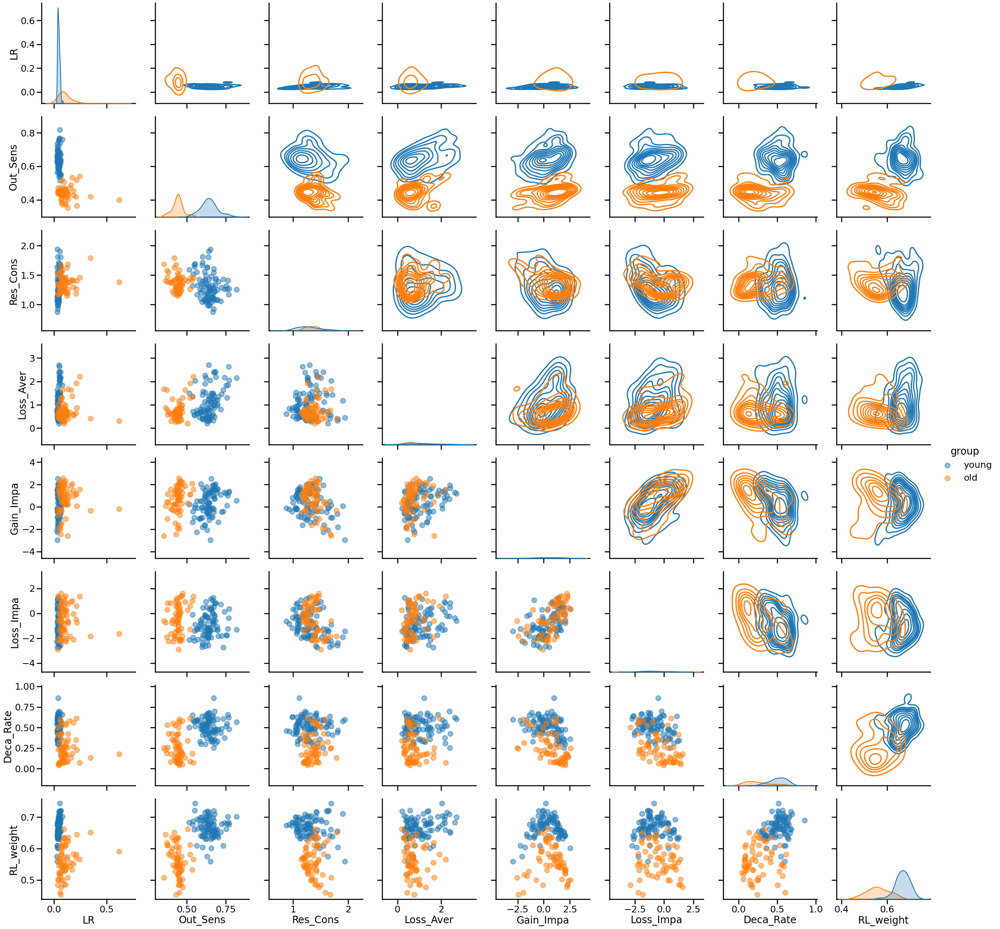

In [3]:
# Create an instance of the PairGrid class.
grid = sns.PairGrid(data = df1,
                    vars = cols,
                    hue="group",
                    aspect=1,
                    height = 4)

# Map a scatter plot to the upper triangle
grid.map_upper(sns.kdeplot)

# Map a density to the diagonal
grid.map_diag(sns.kdeplot, shade=True)

# Map a density plot to the lower triangle
grid.map_lower(plt.scatter, alpha=0.5)
grid.add_legend()

### In practice, there are many types of clustering we can perform, such as:
* Connectivity-based / Hierarchical (Agglomerative)
* Centroid-based (K-Means)
* Expectation-Maximization (Gaussian Mixture Models)
* Density-based (HDBSCAN)
* Graph-based (Spectral)

We will make use of some of these algorithms to identify clusters in our data.

#### Before doing so, we standardise our data to give equal weight to all features and improve clustering accuracy:

In [4]:
# standardise our data
standardised = scipy.stats.zscore(df1[cols])
df1_std = pd.DataFrame(standardised, columns = cols)
df1_std["group"] = df1.group
df1_std

,LR,Out_Sens,Res_Cons,Loss_Aver,Gain_Impa,Loss_Impa,Deca_Rate,RL_weight,group
0,-0.502291,0.630340,-0.618199,0.169659,-0.842824,-1.085232,1.407168,0.563691,young
1,-0.390124,0.629703,1.514082,-1.290663,-0.502920,-0.639829,0.111524,1.450305,young
2,-0.393302,0.382748,0.335619,-0.983347,-0.681861,-0.909377,0.464937,0.989304,young
3,-0.543427,0.677963,-1.324734,-0.221779,-0.584010,-0.695217,1.174449,0.797360,young
4,-0.157737,0.683369,2.399490,-1.076327,-0.911356,-1.674759,0.179512,0.490205,young
...,...,...,...,...,...,...,...,...,...
148,0.612377,-0.896185,0.504136,0.014630,1.560002,1.930609,-1.375354,-2.066993,old
149,-0.219388,-0.993379,1.309483,-0.898781,-2.049766,-1.364699,1.041169,-2.460707,old
150,0.389557,-1.148656,0.503961,-0.845535,0.540231,1.632935,-1.763261,-0.271757,old
151,0.199878,-1.019463,0.386191,-0.166795,1.775551,0.963157,-0.830530,-1.855193,old


## K-Means Clustering
The first clustering method we use is also the most widely known. K-Means clustering is a centroid-based algorithm that is relatively easy to understand.

K number of points are chosen at random in the feature vector space. Then:

1. The distances from each of these points to all datapoints is then calculated and points are assigned to clusters based on the nearest random point. 

2. New cluster centroids are then created by finding the mean distance between all points within a cluster, or partition.

3. Steps 1 and 2 are repeated until the clusters converge, or reach a stable shape. 

The issue with K-Means is that it does not try to find clusters, but rather make sure that EVERY datapoint is put in a cluster. This means that noise in the data will cause distortions.

The K points are placed at random in our space. Therefore, we may get different results every time we run the algorithm, and the optimal starting points may be difficult to find.

Specifiying K is also a problem, because many times we do not know how many clusters there should be. Hence, we use the Elbow method to try different values of K to identify clusters with adequate inertia. Inertia is the total squared error for each cluster. The lower the inertia, the denser the clusters.

We will also take the Silhouette score for each iteration of clusters. The Silhouette score is a useful metric in cluster analysis that takes the mean intra-cluster distance and the mean nearest-cluster distance and scores a clustering from -1 to 1. A high score means that points are well assigned to their clusters and the clusters are distinct from each other. A low score suggests overlapping clusters and poorly assigned datapoints.

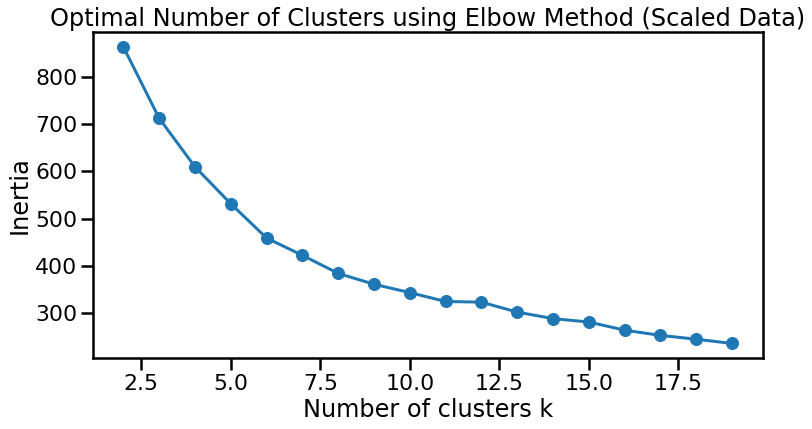

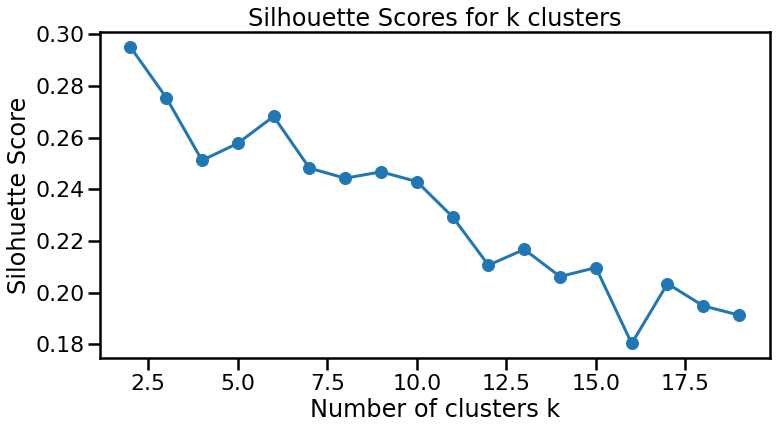

In [5]:
# this function is used to plot inertia for x clusters along with their Silhouette score
# inertia is the sum squared distance of all clusters
# the lower the inertia, the tighter the clusters

def elbow_kmeans(df_std):
    sse = []
    silo_score = []
    dims = len(df_std.columns)

    for k in range(2, 20):
        km = cluster.KMeans(n_clusters=k)
        km.fit(df_std)
        sse.append([k, km.inertia_])
        siloh = silhouette_score(df_std, km.labels_, metric='euclidean')
        silo_score.append([k, silhouette_score(df_std, km.labels_, metric='euclidean')])

    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
    plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
    plt.xlabel('Number of clusters k')
    plt.ylabel('Inertia')
    
    plt.figure(figsize=(12,6))
    plt.plot(pd.DataFrame(silo_score)[0], pd.DataFrame(silo_score)[1], marker='o')
    plt.title('Silhouette Scores for k clusters')
    plt.xlabel('Number of clusters k')
    plt.ylabel('Silohuette Score')
    
elbow_kmeans(df1_std[cols])

## Ensemble Clustering 
A clustering ensemble aims to combine a number of clustering models to produce a better result than that of the individual clustering algorithms. The results of ensemble clustering should be of higher consistency and quality than individual algorithms.

In the following steps we will perform ensemble clustering using K-Means of various random states and k values.

In [6]:
# Ensemble clustering with different random_states
def ensemble_kmeans(data, rnd_states, k_list):
    ## Run clustering with different k and check the metrics
    klabels=[]
    
    print("Performing Ensemble Clustering with KMeans for k ({}) and random states ({})".format(k_list,rnd_states))
    for r in rnd_states:
        for k in k_list:
            clusterer = cluster.KMeans(n_clusters=k, random_state=r)
            clusterer.fit(data)
            klabels.append(clusterer.labels_)
    return np.array(klabels)

rnd_states=[0,1,2,3,4,42,2371]
klist=[2,3,4,5,6]

klabels = ensemble_kmeans(df1_std[cols], rnd_states, klist)
print(klabels)


Performing Ensemble Clustering with KMeans for k ([2, 3, 4, 5, 6]) and random states ([0, 1, 2, 3, 4, 42, 2371])
[[1 1 1 ... 0 0 0]
 [0 2 2 ... 1 1 2]
 [1 1 1 ... 2 2 3]
 ...
 [0 0 0 ... 2 2 3]
 [4 4 4 ... 3 3 0]
 [1 1 1 ... 0 0 5]]


### Co-Occurrence Matrix
An entry in the co-occurrence matrix is the number of times a pair of objects cluster across the ensemble.

The heatmap below represents the number of times any pair of data points co-clusters across the ensemble.

In [7]:
#construct a co-occurrence matrix
def cooc_mat(labels):
    cooc = np.zeros([labels.shape[1], labels.shape[1]], np.int32)
    
    for label in labels:
        for i, val1 in enumerate(label):
            for j, val2 in enumerate(label):
                #filling C_ij

                if val1 == val2 :
                    cooc[i,j] += 1
    
    return pd.DataFrame(cooc)

/home/jack/.local/lib/python3.8/site-packages/seaborn/matrix.py:659: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



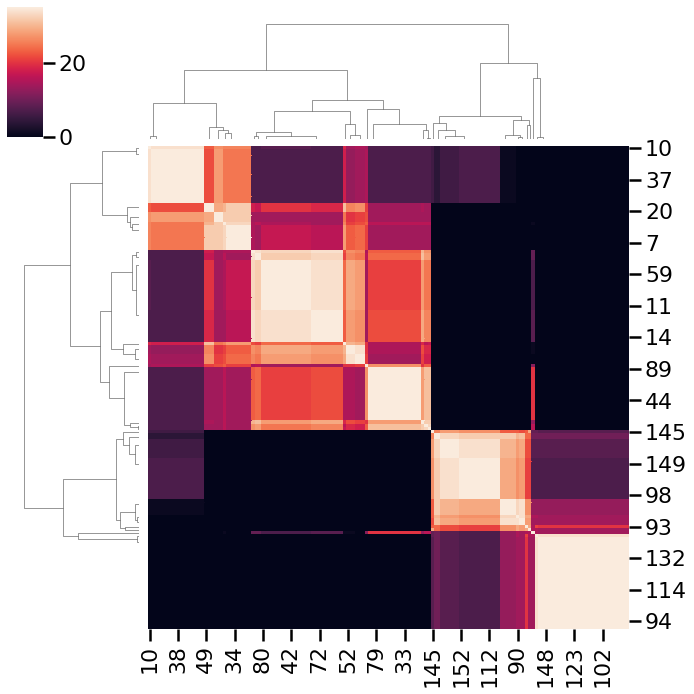

In [8]:
cooc = cooc_mat(klabels)
cooc.columns = df1_std[cols].index
cooc.index = df1_std[cols].index

g = sns.clustermap(cooc)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
plt.show()

In [9]:
# fitting data in Kmeans using our chosen cluster number k

df1_kc = df1_std

start = time.time()
kmeans = cluster.KMeans(n_clusters = 3, random_state=0).fit(df1_kc[cols])
computation_times.append(["kmeans", (time.time() - start)])

clustering_labels.append(kmeans.labels_)

In [10]:
# we append a column called "cluster" which has cluster number for each row respectively.

df1_kc['cluster'] = kmeans.labels_
df1_kc.loc[df1_kc.cluster == 0].count()

LR           72
Out_Sens     72
Res_Cons     72
Loss_Aver    72
Gain_Impa    72
Loss_Impa    72
Deca_Rate    72
RL_weight    72
group        72
cluster      72
dtype: int64

## What makes up a cluster?
The clustering algorithm assigns datapoints to a cluster based on that datapoint's similarity to other datapoints. It decides this similarity by computing the distance between datapoints within the feature vector space.
As this is an unsupervised learning operation, we cannot tell the algorithm how to choose what feature values belong to what cluster.

Depending on the algorithm used, we may have control over variables like:
* The number of clusters
* The minimum number of datapoints needed to create a cluster
* The maximum distance between points to be considered as being in the same neighbourhood

In the following steps, we will visualise the qualities of datapoints(people) assigned to each cluster, and how these clusters separate people in our dataset, without providing their age as input.

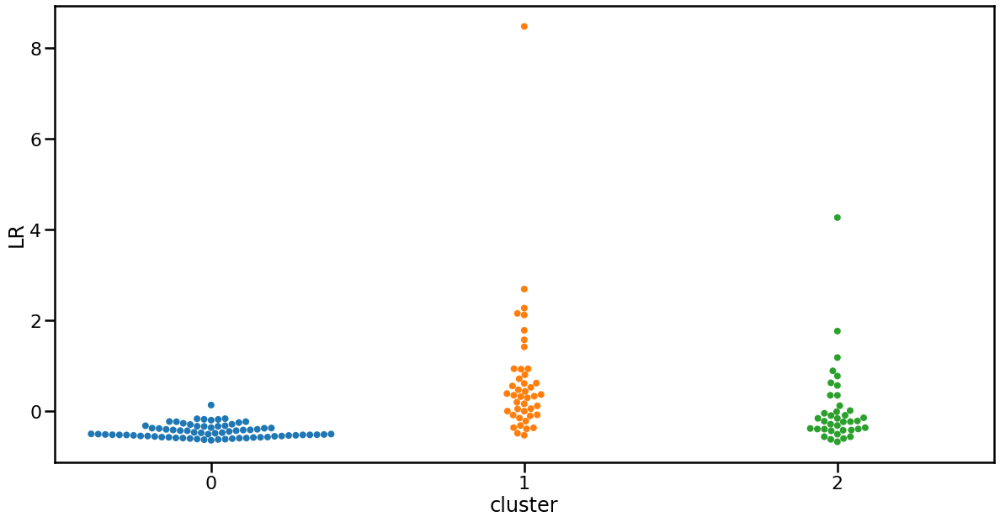

In [11]:
# the following plot shows us the Learning Rate (LR) values of
# participants within each cluster

plt.figure(figsize = (20,10))
sns.swarmplot(x = df1_kc.cluster, y = df1_kc.LR, size=8)

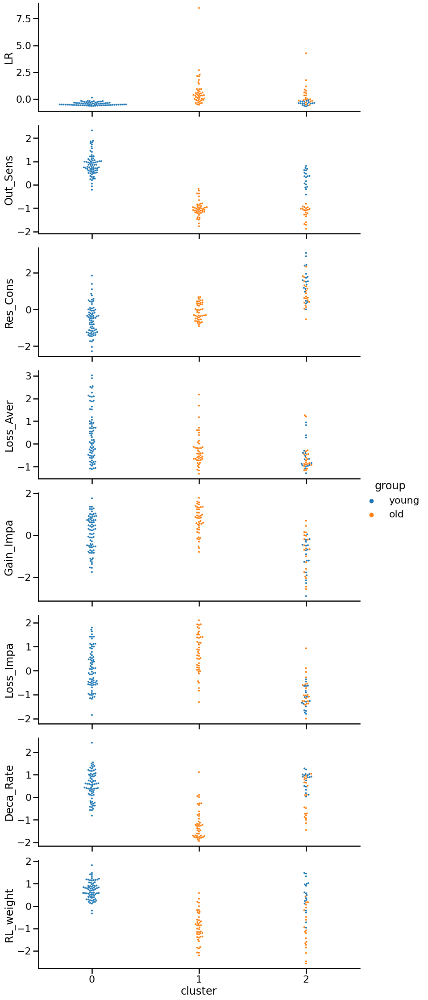

In [12]:
# the standardised variable values for each person in each cluster

g = sns.PairGrid(data = df1_kc,
                 x_vars = "cluster",
                 y_vars = cols,
                 hue="group",
                 aspect=3,
                 height = 4)


g.map(sns.swarmplot, size=4)
g.add_legend()

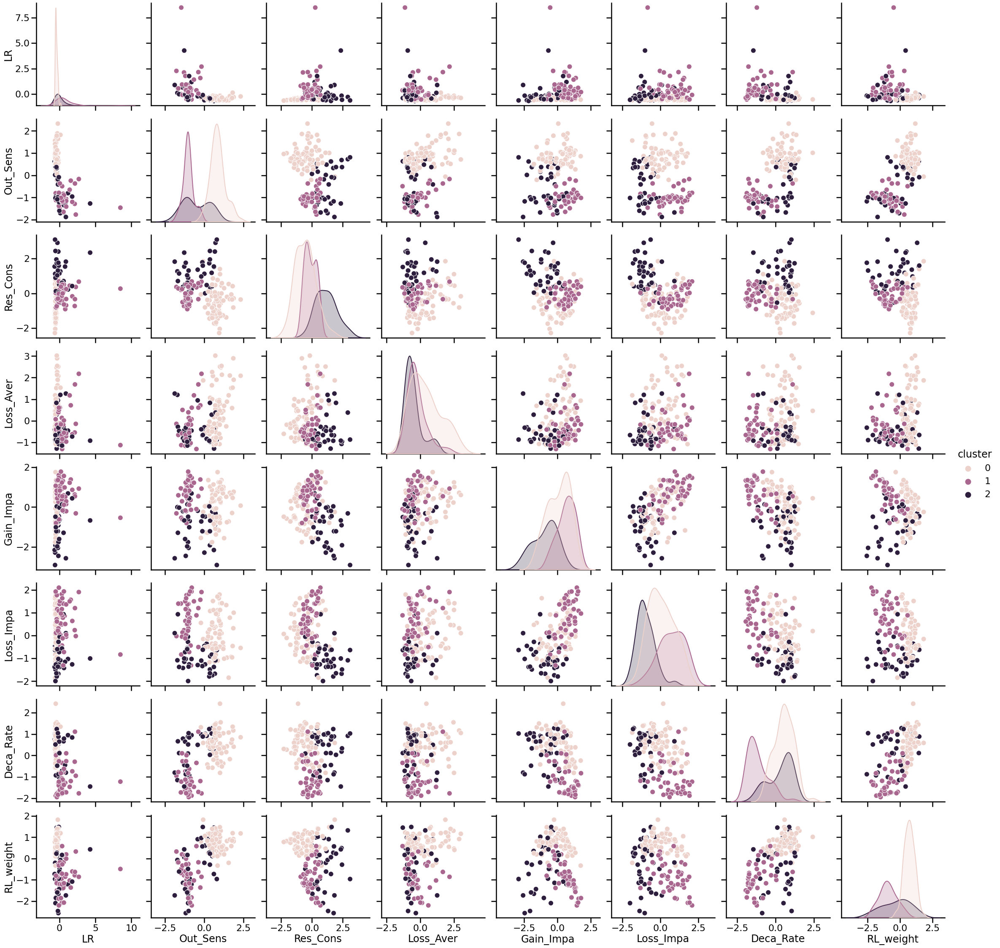

In [13]:
sns.pairplot(df1_kc, hue="cluster", vars=cols, aspect = 1, height = 4)

## HDBSCAN
HDBSCAN is a development of DBSCAN. Both are density-based clustering algorithms. This means that clusters are defined by the number of instances in an area. Instances in sparse areas are considered noise and are not assigned to a specific cluster. These are fast algorithms that can find clusters that methods like K-Means cannot. Unlike K-Means, they will not try to assign every point to a cluster, recognising noise as part of the dataset.

In DBSCAN, the feature vector space is transformed so that lower density datapoints are moved further away. Single linkage is applied to get a dendrogram, or tree, and is cut based on parameters epsilon - the distance between points to be considered "clusterable" - and min_samples - cluster size. Any points above the cut are labelled as "noise".

HDBSCAN works in a simialr way, although it iterates over the dendrogram to find the cut with the most stable clusters. The advantage here is that epsilon does not need to be given, and so clusters of varying density can be found.

In [14]:
# HDBSCAN

df1_hdbscan = df1_std

start = time.time()
scan = hdbscan.HDBSCAN(min_cluster_size = 4).fit(df1_hdbscan[cols])
computation_times.append(["hdbscan", (time.time() - start)])

siloh = silhouette_score(df1_hdbscan[cols], scan.labels_, metric='euclidean')

clustering_labels.append(scan.labels_)

df1_hdbscan["cluster"] = scan.labels_
labels = scan.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print("Number of clusers: {}".format(n_clusters))
print("Number of points labelled as noise: {}".format(n_noise))
print("Silohuette score: {}".format(siloh))

Number of clusers: 2
Number of points labelled as noise: 12
Silohuette score: 0.2709972579740543


/home/jack/.local/lib/python3.8/site-packages/seaborn/categorical.py:1296: UserWarning:

25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



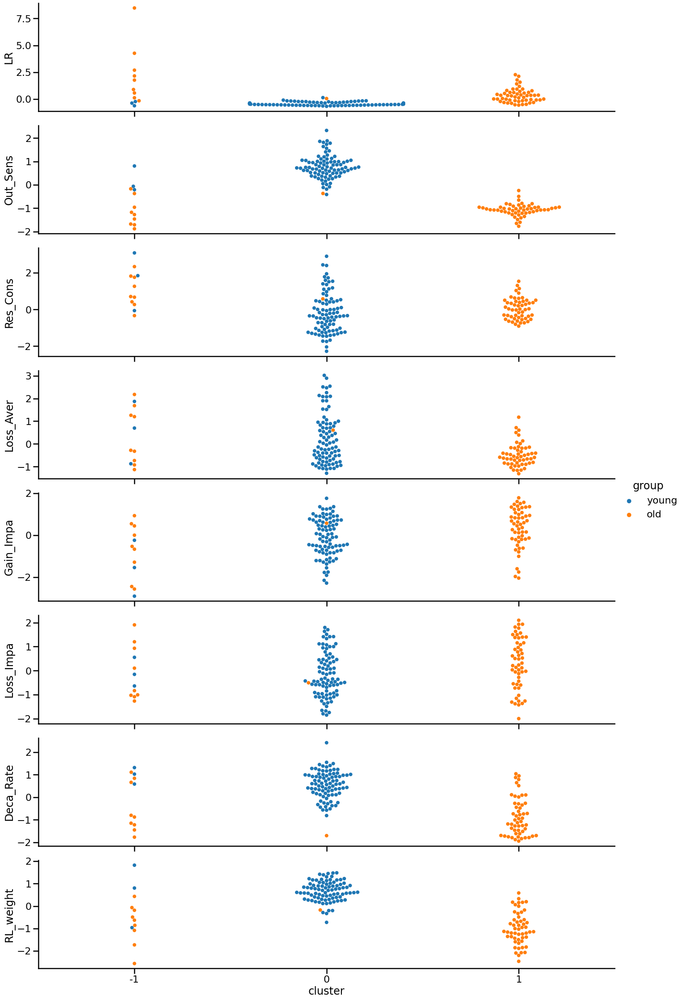

In [15]:
g = sns.PairGrid(data = df1_hdbscan,
                 x_vars = "cluster",
                 y_vars = cols,
                 hue="group",
                 aspect=5,
                 height = 4)


g.map(sns.swarmplot, size=8)
g.add_legend()

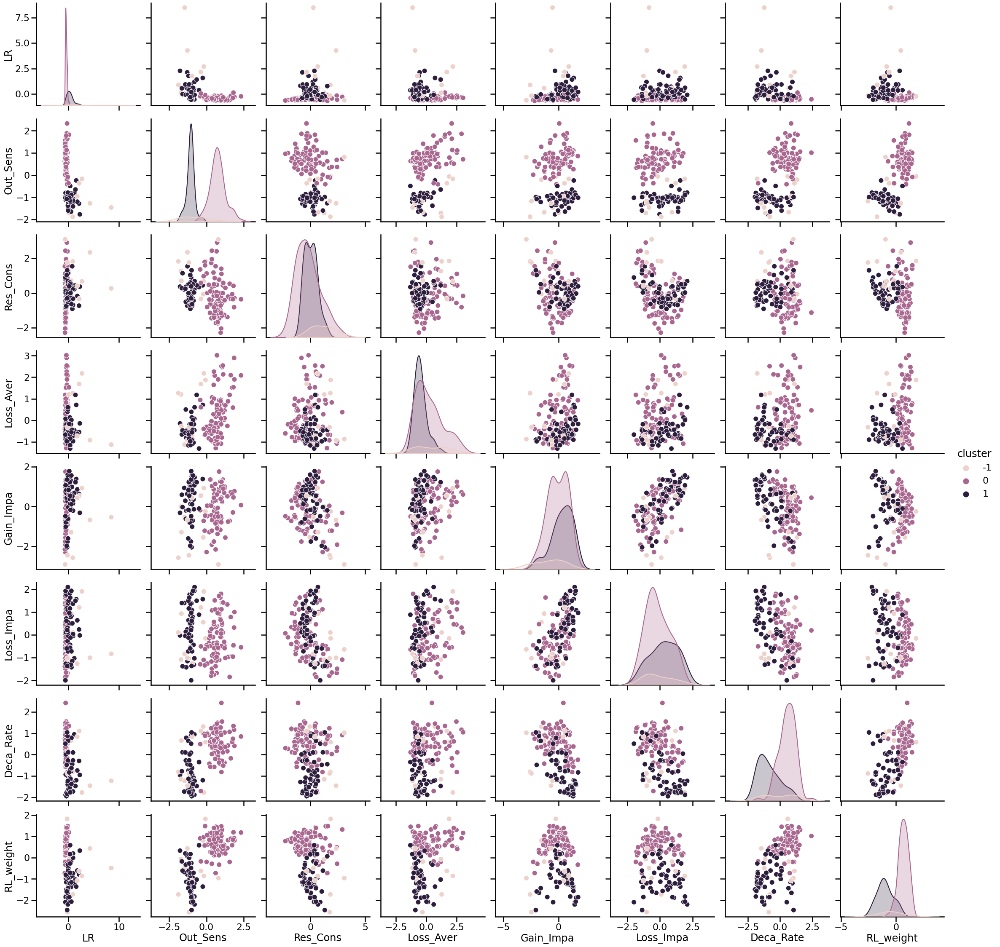

In [16]:
sns.pairplot(df1_hdbscan, hue="cluster", vars=cols, aspect = 1, height = 4)

## Hierarchical Clustering
This algorithm begins by presuming every datapoint is it's own cluster. It then merges to the nearest cluster based on some metric. It continues iteratively merging like this until all clusters are one. 

This provides us with a dendrogram (as shown below), or tree, which helps us learn how the data breaks down into clusters. 

From here, we can cut the tree at the longest line and the number of intersecting lines represent the optimal number of clusters.

This algorithm is significantly slower than the rest shown here, and all datapoints will be clustered, even if they are "noise".

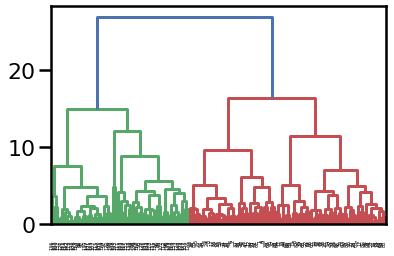

In [17]:
# AGGLOMERATIVE / HIERARCHICAL

import scipy.cluster.hierarchy as sch

dendrogram = sch.dendrogram(sch.linkage(df1_std[cols], method = "ward"))
plt.show()

In [18]:
# fitting hierarchical clustering to our dataset

df1_hc = df1_std
start = time.time()
hc_labels = cluster.AgglomerativeClustering(n_clusters = 3,
                                     affinity = "euclidean",
                                     linkage = "ward").fit_predict(df1_hc[cols])

computation_times.append(["hierarchical", (time.time() - start)])

siloh = silhouette_score(df1_hc[cols], hc_labels, metric='euclidean')

clustering_labels.append(hc_labels)

df1_hc["cluster"] = hc_labels

print("Silohuette score: {}".format(siloh))

Silohuette score: 0.22938033896521748


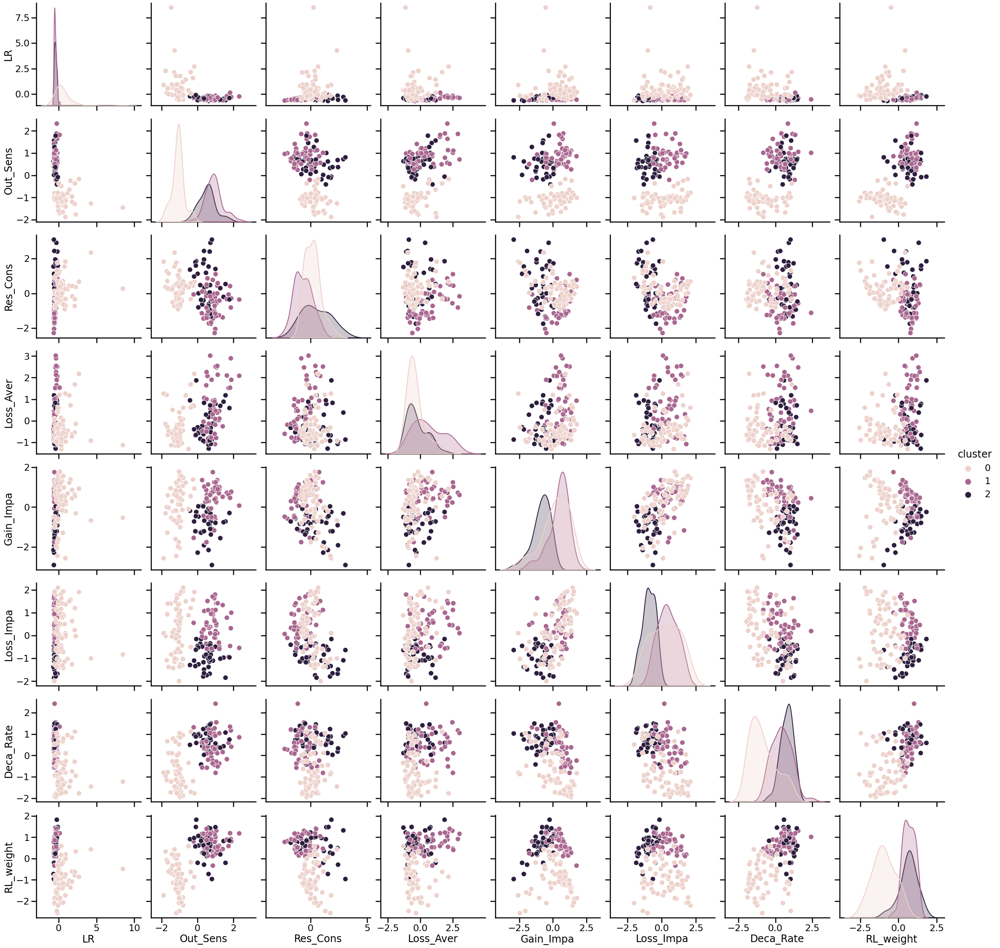

In [19]:
sns.pairplot(df1_hc, hue="cluster", vars=cols, aspect = 1, height = 4)

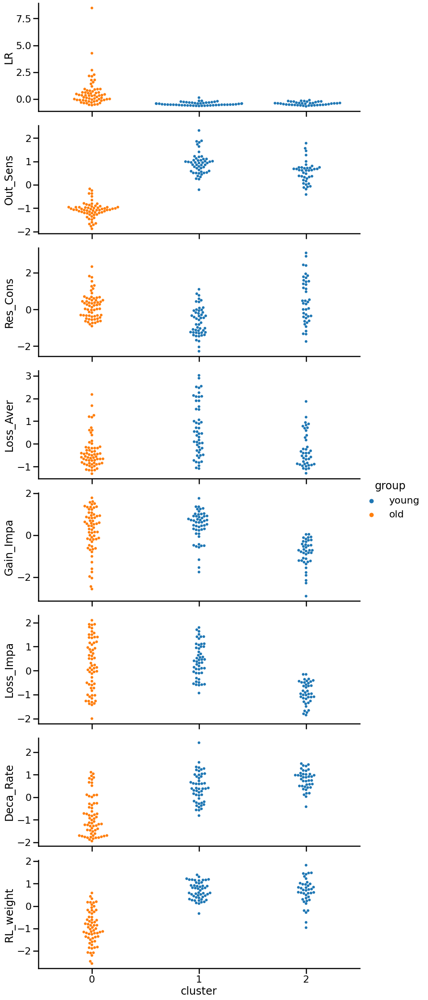

In [20]:
g = sns.PairGrid(data = df1_hc,
                 x_vars = "cluster",
                 y_vars = cols,
                 hue="group",
                 aspect=3,
                 height = 4)


g.map(sns.swarmplot, size=6)
g.add_legend()

## Combining Our Results
Using the labels created from our clustering algorithms, we can create the co-occurrence matrix below.

This matrix tells us the ids of particiapnts and the number of times they appeared together in a cluster. Subject IDs 1 to 90 are in the young group, while >90 are old. There is a clear distinction between young and old here, however there exists some small variations of participants within their own age category.

/home/jack/.local/lib/python3.8/site-packages/seaborn/matrix.py:659: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



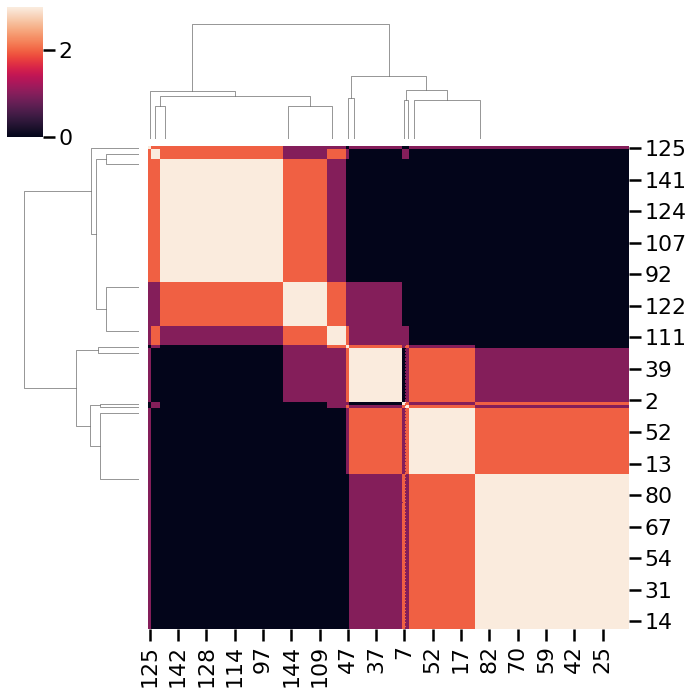

In [21]:
clustering_labels = np.array(clustering_labels)
cooc = cooc_mat(clustering_labels)
cooc.columns = df1_std.index
cooc.index = df1_std.index

g = sns.clustermap(cooc)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0)
plt.show()

## Computation Time
The speed of our clustering algorithm is not very important in this small dataset, but becomes a significant factor when we are dealing with lots of data.

A plot of our compute times are shown below.

In [22]:
computation = pd.DataFrame(computation_times,
             columns=["Algorithm", "Computation Time"]
            ).sort_values("Computation Time")

Text(0, 0.5, 'Computation Time')

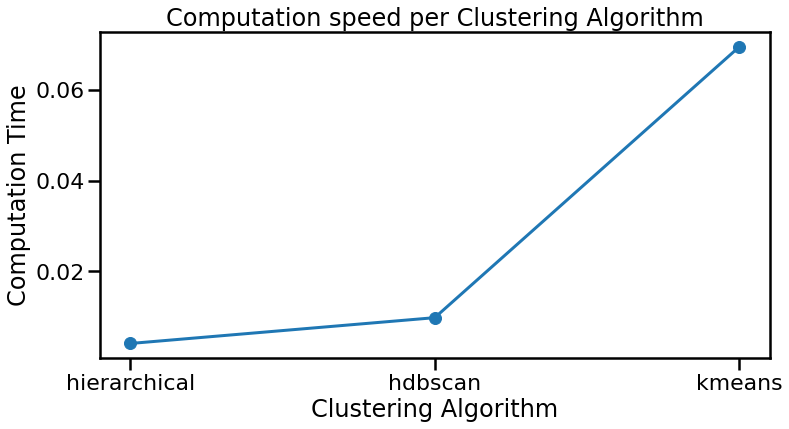

In [23]:
# Algorithm Computation Times 

plt.figure(figsize=(12,6))
plt.plot(computation.iloc[:,0], (computation.iloc[:,1]), marker='o')
plt.title('Computation speed per Clustering Algorithm')
plt.xlabel('Clustering Algorithm')
plt.ylabel('Computation Time')

# Interpretation of Results



Upon reviewing the results of our clustering, we believe the hierarchical technique has presented the most interesting collection of clusters. Our findings are as follows:

## Hierarchical Clustering Results

The clustering algorithm has divided the subjects into one old group and two young. Within these 3 clusters, we can pick out a number of patterns emerging from our subjects. 

* **Cluster 0 is old.** 

They exhibit a relatively higher Learning Rate (LR) and low Loss Aversion. They are not very sensitive to their outcomes, but they will try to avoid losing more than the other two clusters. They experience more impact from gains, and present with a lower learning decay rate.


* **Cluster 1 is our first set of young people.**

As seen in analysis of other datasets, the Learning Rate (LR) for young people is relatively low. They are much more sensitive to outcomes than the older participants, while also playing in a less consistent manner. They react strongly to Gains and Losses, and possess a higher Decay Learning Rate value. 

This group of participants appear to be far more experimental in their play styles when compared to the other clusters. They are less concerned about avoiding loss and more interested in understanding the game.


* **Cluster 2 contains the remainder of our young players.**

This group of players, exhibit a mix of characteristics from our previous two clusters. Similar to cluster 1, they have a lower LR and higher Outcome Sensitivity than our older cluster. 

However, they differ in that they are among the most consistent responders in our dataset. They are not heavily impacted by gains or losses, and their learning decay rate is the highest of the clusters.

These players do not react as much whilst winning or losing, differentiating them from participants of a similar age. This group would present an interesting further look, as there may be other characteristics that explain why they behave this way.




# Conclusion & Future work
Our analysis of this dataset has provided some fascinating insights about the various ways people make decisions in the face of uncertainty, and the ability of several clustering algorithms to discover the differences between them.

If there were more features recorded for each subject, some very interesting insights could be made. For example, the age of participants may reveal changes in decision making between age ranges, rather than simply being "young" or "old". Perhaps the more experimental "old" people may actually be more middle-aged, and experiencing something of a mid-life crisis?

Another interesting future area of work would be in building a classifier based on decision making data. With enough development, such a model could be used as a tool to assist medical practicioners in identifying psychological and physical ireegularities.